### Objectives of this notebook:
- display output from ABRM
- perform analysis on output. eg. feature importance and model selection
- in console do: jupyter nbconvert --to="python" '.\Postprocessing.ipynb'
- this will upload the file in pure python format

In [4]:
import numpy as np
import pandas as pd
import plotly.io as pio
import ABRM_functions

pio.renderers.default = "notebook"

### Import data
- one df with FD performance of each particle  
- one df with associated particle position  
- one dicct with initial setup that would allow reproduction of results

In [38]:
dataset = ["2020_05_20_12_10"]
misfit_tolerance = 0.1

df_performance,df_position,setup_all, FD_targets = ABRM_functions.read_data(dataset)

print("Number of models and parameters:")
display(df_position.shape)
print("Number of particles:")
display(df_position.particle_no.max()+1)
print("Number of Iterations:")
display(df_position.iteration.max()+1)
display(df_performance.head())
display(df_position.head())

Number of models and parameters:


(600, 37)

Number of particles:


30

Number of Iterations:


20

,EV,tD,F,Phi,LC,particle_no,misfit,iteration,dataset
0,0.000000,0.000000,0.000000,0.000000,0.282036,0,0.31425,0,2020_05_20_12_10
1,0.348146,0.348277,0.006413,0.002102,0.282036,0,0.31425,0,2020_05_20_12_10
2,0.386407,0.387013,0.018919,0.006716,0.282036,0,0.31425,0,2020_05_20_12_10
3,0.410766,0.411988,0.031523,0.011765,0.282036,0,0.31425,0,2020_05_20_12_10
4,0.426870,0.428710,0.042885,0.016545,0.282036,0,0.31425,0,2020_05_20_12_10


,TI1,F1_I_MIN,F1_I_MAX,F1_J_MIN,F1_J_MAX,F1_K_MIN,F1_K_MAX,TI2,F2_I_MIN,F2_I_MAX,...,MatrixpermY,FracpermZ,MatrixpermZ,misfit,particle_no,LC,entropy_swarm,combined_misfit_entropy_swarm,iteration,dataset
0,3.0,16.0,110.0,14.0,99.0,5.0,6.0,2.0,119.0,163.0,...,21.113894,313.489607,21.036637,0.314250,0,0.282036,0.0,1.314250,0,2020_05_20_12_10
1,3.0,131.0,172.0,56.0,63.0,1.0,2.0,3.0,134.0,162.0,...,38.572805,333.131520,14.234848,0.549548,1,0.131673,0.0,1.549548,0,2020_05_20_12_10
2,4.0,141.0,153.0,11.0,49.0,4.0,6.0,2.0,85.0,97.0,...,20.387422,404.041273,46.831583,0.362351,2,0.248475,0.0,1.362351,0,2020_05_20_12_10
3,2.0,107.0,183.0,7.0,37.0,3.0,4.0,4.0,52.0,155.0,...,17.008444,814.603153,14.138059,0.398832,3,0.249585,0.0,1.398832,0,2020_05_20_12_10
4,3.0,19.0,107.0,78.0,78.0,3.0,4.0,3.0,128.0,195.0,...,9.647010,81.767746,39.696884,0.385523,4,0.224681,0.0,1.385523,0,2020_05_20_12_10


### Plot performance

In [39]:
ABRM_functions.plot_performance(df_performance,df_position,FD_targets,setup_all,dataset,misfit_tolerance)

### Boxplots parameters
explore if ranges of parameters need potential modifications

In [40]:
ABRM_functions.plot_box(df = df_position,setup_all = setup_all, dataset = dataset)

### Histogram Paramters

In [41]:
ABRM_functions.plot_hist(df = df_position,setup_all = setup_all, dataset = dataset,misfit_tolerance = None)

### Histograms for best models parameters

In [42]:
ABRM_functions.plot_hist(df = df_position,setup_all = setup_all, dataset = dataset,misfit_tolerance = misfit_tolerance)

### Cluster best models with UMAP and HDBSCAN

In [53]:
df_best = ABRM_functions.best_model_selection_UMAP_HDBSCAN(df = df_position,dataset =dataset,setup_all = setup_all,
                                                           n_neighbors= 4, min_cluster_size=3, misfit_tolerance = misfit_tolerance,
                                                           use_UMAP = True)

### Build best performing models for flow simulation

In [17]:
best_models = ABRM_functions.save_best_clustered_models(df_best = df_best, datasets = dataset)

### Feature importance - model explainability

In [54]:
import shap
from sklearn.ensemble import RandomForestRegressor


In [55]:
columns = setup_all[dataset[0]]["columns"]
X_train = df_position[columns]
Y_train = df_position.LC

In [56]:
# load JS visualization code to notebook
shap.initjs()

In [57]:
model = RandomForestRegressor(max_depth=6, random_state=0, n_estimators=10)
model.fit(X_train, Y_train)

RandomForestRegressor(bootstrap=True, ccp_alpha=0.0, criterion='mse',
                      max_depth=6, max_features='auto', max_leaf_nodes=None,
                      max_samples=None, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=1,
                      min_samples_split=2, min_weight_fraction_leaf=0.0,
                      n_estimators=10, n_jobs=None, oob_score=False,
                      random_state=0, verbose=0, warm_start=False)

Setting feature_perturbation = "tree_path_dependent" because no background data was given.


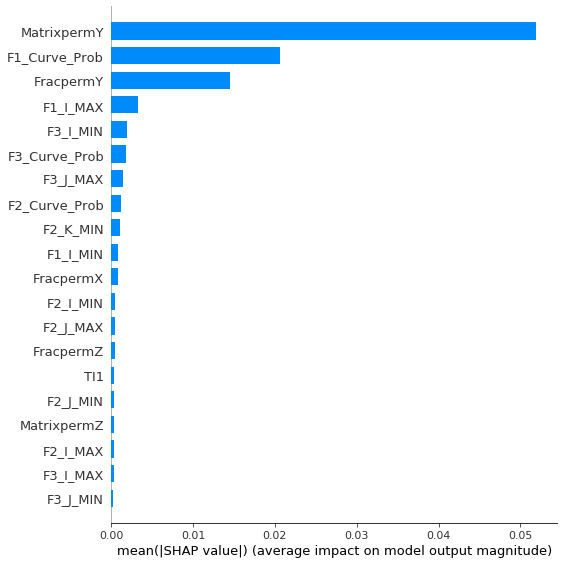

In [58]:
shap_values = shap.TreeExplainer(model).shap_values(X_train)
shap.summary_plot(shap_values, X_train, plot_type="bar")

In [59]:
# explain the model's predictions using SHAP
# (same syntax works for LightGBM, CatBoost, scikit-learn and spark models)
explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(X_train)

# visualize the first prediction's explanation (use matplotlib=True to avoid Javascript)
shap.force_plot(explainer.expected_value, shap_values[80,:], X_train.iloc[80,:])

In [60]:
# visualize the training set predictions
shap.force_plot(explainer.expected_value, shap_values, X_train)

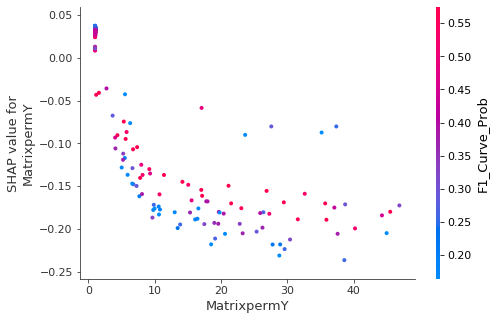

In [61]:
# create a dependence plot to show the effect of a single feature across the whole dataset
shap.dependence_plot("MatrixpermY", shap_values, X_train)

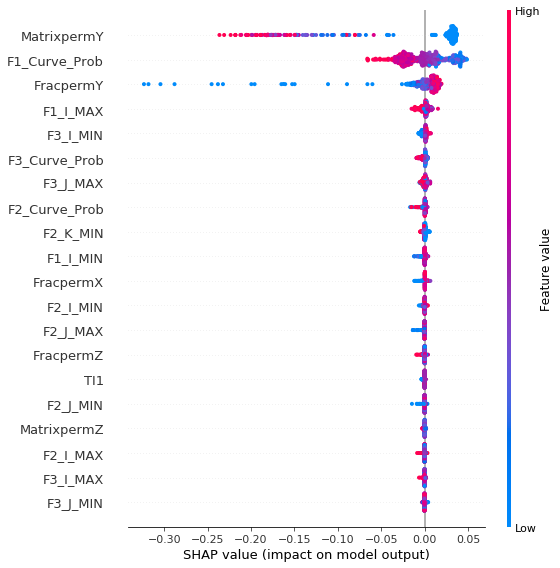

In [62]:
shap.summary_plot(shap_values, X_train)


In [ ]:
def plot_performance(df_performance,df_position,FD_targets,setup_all,dataset,misfit_tolerance):
    # Create traces

    fig = make_subplots(rows = 2, cols = 2,
                       subplot_titles = ("Misfit","LC plot","F - Phi Graph","Sweep Efficieny Graph"))

    ### Misfit ###
    
    fig.add_trace(go.Scatter(x = df_position.index[(df_position.dataset == dataset[0])], y=df_position.misfit[(df_position.dataset == dataset[0])],
                            mode='markers',
                            line = dict(color = "black"),
                            name='misfit'),row =1, col =1)
    
    fig.add_trace(go.Scatter( x= df_position.index[(df_position.misfit <= misfit_tolerance) & (df_position.dataset == dataset[0])],y=df_position.loc[(df_position.misfit <= misfit_tolerance) & (df_position.dataset == dataset[0]),"misfit"],
                            mode = "markers",
                            line = dict(color = "magenta")))

    fig.update_xaxes(range = [0,df_position.index.max()],row =1, col =1)
    fig.update_yaxes(range = [0,1], row =1, col = 1)

    ### LC plot ###
    
    fig.add_trace(go.Scatter(x = df_position.index, y=df_position.LC,
                            mode='markers',
                            line = dict(color = "lightgray"),
                            name='Simulated'),row =1, col =2)
    fig.add_trace(go.Scatter( x= df_position.index[(df_position.misfit <= misfit_tolerance)],y=df_position.loc[(df_position.misfit <= misfit_tolerance,"LC")],
                                mode = "markers",
                            line = dict(color = "magenta")),row =1, col =2)
    
    fig.add_shape(
            # Line Horizontal
                type="line",
                x0=0,
                y0=FD_targets[dataset[0]]["LC_interpolated"], # make date a criterion taht can be changed
                x1=df_position.index.max(),
                y1=FD_targets[dataset[0]]["LC_interpolated"],
                line=dict(
                    color="red",
                    width=2),row =1, col = 2)

    fig.update_xaxes(title_text = "particles",row = 1, col = 1)
    fig.update_yaxes(title_text = "RMSE",row = 1, col = 1)
    fig.update_xaxes(title_text = "particles",range = [0,df_position.index.max()],row =1, col = 2)
    fig.update_yaxes(title_text = "LC",range = [0,1], row =1, col = 2)

    ### F - Phi plot ###
    
    fig.add_trace(go.Scatter(x=df_performance.Phi, y=df_performance.F,
                            mode='lines',
                            line = dict(color = "lightgray"),
                            name='Simulated'),row =2, col =1)

    fig.add_trace(go.Scatter(x = df_performance.loc[(df_performance.misfit <= misfit_tolerance,"Phi")], # make misfit value a criterion that can be changed
                             y = df_performance.loc[(df_performance.misfit <= misfit_tolerance,"F")],
                            mode = "lines",
                            line = dict(color = "magenta"),
                            text = "nothing yet",
                            name = "best simulations"),row =2, col =1)
    
    fig.add_trace(go.Scatter(x = FD_targets[dataset[0]]["Phi_interpolated"], y = FD_targets[dataset[0]]["F_interpolated"],
                            mode = "lines",
                            line = dict(color = "red", width = 3),
                            name = "target"),row =2, col =1)
    
    fig.add_trace(go.Scatter(x = [0,1], y = [0,1],
                            mode = "lines",
                            line = dict(color = "black", width = 3),
                            name = "homogeneous"),row =2, col =1)

    fig.update_xaxes(title_text = "Phi", range = [0,1],row =2, col =1)
    fig.update_yaxes(title_text = "F",range = [0,1], row =2, col = 1)

    ### Sweep efficiency plot ###
    
    for i in range (0,df_performance.iteration.max()):
        iteration = i 
        for j in range(0,df_performance.particle_no.max()):
            particle_no = j
            EV = df_performance[(df_performance.iteration == iteration) & (df_performance.particle_no == particle_no)].EV
            tD = df_performance[(df_performance.iteration == iteration) & (df_performance.particle_no == particle_no)].tD

            fig.add_trace(go.Scatter(x=tD, y=EV,
                                mode='lines',
                                line = dict(color = "lightgray"),
                                text = "nothing yet",
                                name = "Simulated"),row =2, col =2)

    for i in range (0,df_performance.iteration.max()):
        iteration = i 
        for j in range(0,df_performance.particle_no.max()):
            particle_no = j
            EV = df_performance[(df_performance.iteration == iteration) & (df_performance.particle_no == particle_no) & (df_performance.misfit <= misfit_tolerance)].EV
            tD = df_performance[(df_performance.iteration == iteration) & (df_performance.particle_no == particle_no) & (df_performance.misfit <= misfit_tolerance)].tD

            fig.add_trace(go.Scatter(x=tD, y=EV,
                                mode='lines',
                                line = dict(color = "magenta"),
                                text = "nothing yet",
                                name = "best simulations"),row =2, col =2)

    fig.update_xaxes(title_text = "tD", range = [0,1],row =2, col =2)
    fig.update_yaxes(title_text = "Ev",range = [0,1], row =2, col = 2)

    fig.update_layout(title='Performance Evaluation - Simulation run {}'.format(dataset),
                       autosize = False,
                     width = 1000,
                     height = 1000,
                     showlegend = False)

    fig.show()


In [ ]:
def best_model_selection_UMAP_HDBSCAN(df,setup_all,dataset,n_neighbors,min_cluster_size,misfit_tolerance,use_UMAP = True):
    # at some point make n_eighbours and min cluster size nad misfit tolernaze sliding scales
    # model parameters that generate lowest misfit
    if use_UMAP == True:
        columns = setup_all[dataset[0]]["columns"]
        df_best =df[(df.misfit <= misfit_tolerance)].copy()
        df_best_for_clustering = df_best[columns].copy()
        
        # Create UMAP reducer
        reducer    = umap.UMAP(n_neighbors=n_neighbors)
        embeddings = reducer.fit_transform(df_best_for_clustering)

        # Create HDBSCAN clusters
        hdb = hdbscan.HDBSCAN(min_cluster_size=min_cluster_size)
        scoreTitles = hdb.fit(embeddings)
        
        df_best["cluster_prob"] = scoreTitles.probabilities_
        df_best["cluster"] = scoreTitles.labels_
        
        fig = go.Figure(data=go.Scatter(x = embeddings[:,0],
                                        y = embeddings[:,1],
                                
                                        mode='markers',
                                        text = df_best.index,
                                        marker=dict(
                                            size=16,
                                            color=df_best.cluster, #set color equal to a variable
                                            colorscale= "deep",#'Viridis', # one of plotly colorscales
                                            showscale=True,
                                            colorbar=dict(title="Clusters")
                                            )
                                        ))
        fig.update_layout(title='Clustering of {} best models - Number of clusters found: {} - Unclustered models: {}'.format(df_best.shape[0],df_best.cluster.max()+1,abs(df_best.cluster[df_best.cluster == -1].sum())))
        fig.show()
    
    else:
        columns = setup_all[dataset[0]]["columns"]
        df_best =df[(df.misfit <= misfit_tolerance)].copy()
        df_best_for_clustering = df_best[columns].copy()
        
        # Create UMAP reducer
        reducer    = umap.UMAP(n_neighbors=n_neighbors)
        embeddings = reducer.fit_transform(df_best_for_clustering)

        # Create HDBSCAN clusters
        hdb = hdbscan.HDBSCAN(min_cluster_size=min_cluster_size)
        scoreTitles = hdb.fit(df_best_for_clustering)
        
        df_best["cluster_prob"] = scoreTitles.probabilities_
        df_best["cluster"] = scoreTitles.labels_
        
        fig = go.Figure(data=go.Scatter(x = embeddings[:,0],
                                        y = embeddings[:,1],
                                
                                        mode='markers',
                                        text = df_best.index,
                                        marker=dict(
                                            size=16,
                                            color=df_best.cluster, #set color equal to a variable
                                            colorscale= "deep",#'Viridis', # one of plotly colorscales
                                            showscale=True,
                                            colorbar=dict(title="Clusters")
                                            )
                                        ))
        fig.update_layout(title='Clustering of {} best models - Number of clusters found: {} - Unclustered models: {}'.format(df_best.shape[0],df_best.cluster.max()+1,abs(df_best.cluster[df_best.cluster == -1].sum())))
        fig.show()
    
    return df_best

In [31]:
from pyentrp import entropy as ent


In [69]:
entropy = ent.shannon_entropy(df_position.MatrixpermY.round(10))
entropy

0.9400608934896088

In [61]:
df_position.head()

,TI1,F1_I_MIN,F1_I_MAX,F1_J_MIN,F1_J_MAX,F1_K_MIN,F1_K_MAX,TI2,F2_I_MIN,F2_I_MAX,...,MatrixpermX,FracpermY,MatrixpermY,FracpermZ,MatrixpermZ,misfit,particle_no,LC,iteration,dataset
0,3.0,74.0,136.0,10.0,73.0,1.0,5.0,3.0,26.0,143.0,...,19.312769,597.400810,18.292827,937.991681,48.252298,0.407947,0,0.227704,0,2020_05_15_22_14
1,2.0,70.0,169.0,23.0,24.0,4.0,6.0,1.0,59.0,126.0,...,46.626181,841.189767,2.679455,818.668724,44.116321,0.442822,1,0.190290,0,2020_05_15_22_14
2,4.0,38.0,194.0,72.0,92.0,2.0,5.0,3.0,119.0,124.0,...,40.466097,141.332896,43.050010,167.790724,5.491856,0.406345,2,0.220684,0,2020_05_15_22_14
3,1.0,30.0,67.0,22.0,23.0,3.0,5.0,1.0,52.0,171.0,...,23.355688,323.107083,34.884567,329.607938,15.525027,0.502485,3,0.162141,0,2020_05_15_22_14
4,3.0,43.0,87.0,30.0,86.0,2.0,5.0,3.0,69.0,144.0,...,15.428506,302.738729,28.900550,126.629368,41.421909,0.472332,4,0.188821,0,2020_05_15_22_14


In [64]:
df_position["TI1"].iloc[-5:]

595    3.0
596    3.0
597    4.0
598    3.0
599    3.0
Name: TI1, dtype: float64